<a href="https://colab.research.google.com/github/warninjaden/Neural-Networks-Project/blob/main/asiansGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
project_name = 'asiangan'

In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/jorgewarden/asianpersons'
od.download(dataset_url)


Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: jorgewarden
Your Kaggle Key: ··········


100%|██████████| 1.01M/1.01M [00:00<00:00, 101MB/s]

In [ ]:
import os

DATA_DIR = './asianpersons'
print(os.listdir(DATA_DIR))

['images_resize']


In [ ]:
print(os.listdir(DATA_DIR+'/images_resize/')[:10])

['10385A35.jpg', '10489A36.jpg', '10316A34.jpg', '11038A39.jpg', '10776A37.jpg', '10878A38.jpg', '10807A37.jpg', '11006A39.jpg', '10419A35.jpg', '10490A36.jpg']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=1):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


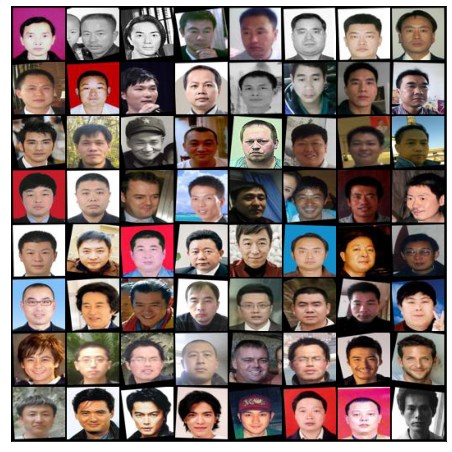

In [ ]:
show_batch(train_dl)

In [ ]:
!pip install jovian --upgrade --quiet

     |████████████████████████████████| 68 kB 2.9 MB/s 


In [ ]:
import jovian
jovian.set_project('asiangan')
jovian.set_colab_id('15Y4ZiU9995amv-jhxdSYm87JF_gJ-A4o')

In [ ]:
jovian.commit(project=project_name, environment=None)

[jovian] Detected Colab notebook...
[jovian] Please enter your API key ( from https://jovian.ai/ ):
API KEY: ··········
[jovian] Uploading colab notebook to Jovian...


[jovian] Error: Looks like the notebook is missing output cells, please save the notebook and try jovian.commit again.


Committed successfully! https://jovian.ai/warden-alb/asiangan


'https://jovian.ai/warden-alb/asiangan'

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


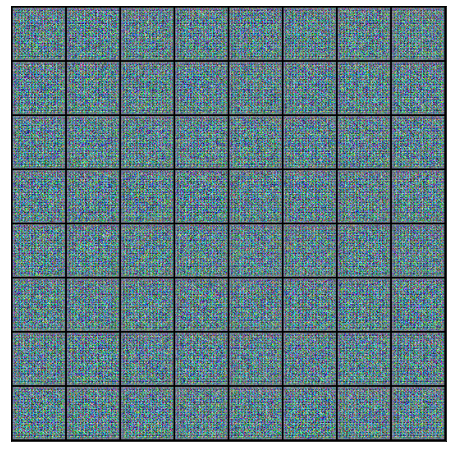

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


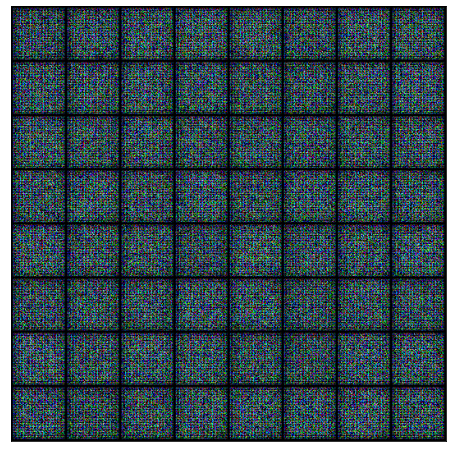

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 500

In [ ]:
!pip install jovian --upgrade --quiet

In [ ]:
import jovian

In [ ]:
jovian.reset()
jovian.log_hyperparams(lr=lr, epochs=epochs)

[jovian] Hyperparams logged.


In [ ]:
history = fit(epochs, lr)

  0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch [1/500], loss_g: 5.1760, loss_d: 0.4610, real_score: 0.8513, fake_score: 0.2028
Saving generated-images-0001.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [2/500], loss_g: 6.8706, loss_d: 0.2005, real_score: 0.9059, fake_score: 0.0549
Saving generated-images-0002.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [3/500], loss_g: 6.1788, loss_d: 0.0740, real_score: 0.9467, fake_score: 0.0129
Saving generated-images-0003.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [4/500], loss_g: 12.2108, loss_d: 0.5641, real_score: 0.9673, fake_score: 0.3981
Saving generated-images-0004.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [5/500], loss_g: 10.2504, loss_d: 0.2375, real_score: 0.9238, fake_score: 0.1275
Saving generated-images-0005.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [6/500], loss_g: 11.5683, loss_d: 0.0881, real_score: 0.9259, fake_score: 0.0000
Saving generated-images-0006.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [7/500], loss_g: 12.3679, loss_d: 0.0401, real_score: 0.9633, fake_score: 0.0000
Saving generated-images-0007.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [8/500], loss_g: 7.4947, loss_d: 0.0404, real_score: 0.9635, fake_score: 0.0010
Saving generated-images-0008.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [9/500], loss_g: 12.6025, loss_d: 0.0223, real_score: 0.9792, fake_score: 0.0000
Saving generated-images-0009.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/500], loss_g: 16.8980, loss_d: 0.0800, real_score: 0.9318, fake_score: 0.0000
Saving generated-images-0010.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/500], loss_g: 17.4695, loss_d: 2.7367, real_score: 0.9963, fake_score: 0.9215
Saving generated-images-0011.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/500], loss_g: 13.1373, loss_d: 0.0147, real_score: 0.9859, fake_score: 0.0000
Saving generated-images-0012.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/500], loss_g: 10.8090, loss_d: 0.0505, real_score: 0.9569, fake_score: 0.0008
Saving generated-images-0013.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/500], loss_g: 9.1754, loss_d: 0.0794, real_score: 0.9347, fake_score: 0.0020
Saving generated-images-0014.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/500], loss_g: 12.3808, loss_d: 0.0795, real_score: 0.9366, fake_score: 0.0000
Saving generated-images-0015.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/500], loss_g: 9.0985, loss_d: 0.1520, real_score: 0.8882, fake_score: 0.0010
Saving generated-images-0016.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/500], loss_g: 6.9600, loss_d: 0.1788, real_score: 0.8712, fake_score: 0.0061
Saving generated-images-0017.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/500], loss_g: 7.8324, loss_d: 0.0526, real_score: 0.9536, fake_score: 0.0019
Saving generated-images-0018.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/500], loss_g: 4.9887, loss_d: 0.1197, real_score: 0.9540, fake_score: 0.0658
Saving generated-images-0019.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/500], loss_g: 6.8631, loss_d: 0.0298, real_score: 0.9773, fake_score: 0.0045
Saving generated-images-0020.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/500], loss_g: 6.7779, loss_d: 0.1023, real_score: 0.9165, fake_score: 0.0034
Saving generated-images-0021.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/500], loss_g: 8.9741, loss_d: 0.0652, real_score: 0.9466, fake_score: 0.0009
Saving generated-images-0022.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/500], loss_g: 6.5951, loss_d: 0.0532, real_score: 0.9785, fake_score: 0.0293
Saving generated-images-0023.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/500], loss_g: 13.5255, loss_d: 0.6496, real_score: 0.9616, fake_score: 0.4373
Saving generated-images-0024.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/500], loss_g: 12.9525, loss_d: 0.7438, real_score: 0.6336, fake_score: 0.0004
Saving generated-images-0025.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/500], loss_g: 4.5237, loss_d: 0.1102, real_score: 0.9855, fake_score: 0.0849
Saving generated-images-0026.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/500], loss_g: 4.9181, loss_d: 0.2359, real_score: 0.9099, fake_score: 0.0979
Saving generated-images-0027.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/500], loss_g: 5.4989, loss_d: 0.1537, real_score: 0.9232, fake_score: 0.0651
Saving generated-images-0028.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/500], loss_g: 6.1128, loss_d: 0.1842, real_score: 0.9258, fake_score: 0.0939
Saving generated-images-0029.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/500], loss_g: 4.9359, loss_d: 0.1683, real_score: 0.9194, fake_score: 0.0711
Saving generated-images-0030.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/500], loss_g: 12.8164, loss_d: 3.9898, real_score: 0.9893, fake_score: 0.9685
Saving generated-images-0031.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/500], loss_g: 4.8503, loss_d: 0.2984, real_score: 0.9768, fake_score: 0.2260
Saving generated-images-0032.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/500], loss_g: 9.0330, loss_d: 1.9413, real_score: 0.9817, fake_score: 0.8338
Saving generated-images-0033.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/500], loss_g: 5.2834, loss_d: 0.1581, real_score: 0.9226, fake_score: 0.0676
Saving generated-images-0034.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/500], loss_g: 3.5025, loss_d: 0.2998, real_score: 0.8455, fake_score: 0.0948
Saving generated-images-0035.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/500], loss_g: 4.9302, loss_d: 0.2315, real_score: 0.8313, fake_score: 0.0226
Saving generated-images-0036.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/500], loss_g: 3.8072, loss_d: 0.3490, real_score: 0.8042, fake_score: 0.0858
Saving generated-images-0037.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/500], loss_g: 4.4115, loss_d: 0.2318, real_score: 0.8636, fake_score: 0.0586
Saving generated-images-0038.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/500], loss_g: 4.8464, loss_d: 0.1217, real_score: 0.9414, fake_score: 0.0548
Saving generated-images-0039.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/500], loss_g: 5.4244, loss_d: 0.2215, real_score: 0.9104, fake_score: 0.1058
Saving generated-images-0040.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/500], loss_g: 7.2268, loss_d: 0.3523, real_score: 0.9326, fake_score: 0.2292
Saving generated-images-0041.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/500], loss_g: 2.6494, loss_d: 0.2212, real_score: 0.9339, fake_score: 0.1280
Saving generated-images-0042.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/500], loss_g: 5.6688, loss_d: 0.4322, real_score: 0.9679, fake_score: 0.3005
Saving generated-images-0043.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/500], loss_g: 4.9656, loss_d: 0.3479, real_score: 0.9342, fake_score: 0.2269
Saving generated-images-0044.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/500], loss_g: 4.2956, loss_d: 0.2344, real_score: 0.8957, fake_score: 0.1019
Saving generated-images-0045.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [46/500], loss_g: 6.1096, loss_d: 1.0450, real_score: 0.4358, fake_score: 0.0012
Saving generated-images-0046.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [47/500], loss_g: 3.9268, loss_d: 0.2307, real_score: 0.9153, fake_score: 0.1155
Saving generated-images-0047.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [48/500], loss_g: 6.9160, loss_d: 0.5366, real_score: 0.9320, fake_score: 0.3400
Saving generated-images-0048.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [49/500], loss_g: 5.0465, loss_d: 0.6585, real_score: 0.9805, fake_score: 0.4352
Saving generated-images-0049.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [50/500], loss_g: 3.5647, loss_d: 0.2931, real_score: 0.8563, fake_score: 0.1159
Saving generated-images-0050.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [51/500], loss_g: 5.9212, loss_d: 0.2416, real_score: 0.9475, fake_score: 0.1618
Saving generated-images-0051.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [52/500], loss_g: 8.7666, loss_d: 0.7297, real_score: 0.9382, fake_score: 0.4103
Saving generated-images-0052.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [53/500], loss_g: 4.7070, loss_d: 0.0666, real_score: 0.9465, fake_score: 0.0075
Saving generated-images-0053.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [54/500], loss_g: 4.2322, loss_d: 0.3777, real_score: 0.8226, fake_score: 0.1204
Saving generated-images-0054.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [55/500], loss_g: 6.1717, loss_d: 0.5675, real_score: 0.9535, fake_score: 0.3547
Saving generated-images-0055.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [56/500], loss_g: 3.9882, loss_d: 0.2285, real_score: 0.9381, fake_score: 0.1384
Saving generated-images-0056.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [57/500], loss_g: 5.1297, loss_d: 0.2615, real_score: 0.9157, fake_score: 0.1403
Saving generated-images-0057.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [58/500], loss_g: 4.9474, loss_d: 0.2123, real_score: 0.8956, fake_score: 0.0799
Saving generated-images-0058.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [59/500], loss_g: 5.6331, loss_d: 0.2150, real_score: 0.9194, fake_score: 0.1093
Saving generated-images-0059.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [60/500], loss_g: 7.1815, loss_d: 0.1990, real_score: 0.9801, fake_score: 0.1523
Saving generated-images-0060.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [61/500], loss_g: 5.2911, loss_d: 0.3340, real_score: 0.9305, fake_score: 0.2133
Saving generated-images-0061.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [62/500], loss_g: 4.2939, loss_d: 0.2275, real_score: 0.9153, fake_score: 0.1167
Saving generated-images-0062.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [63/500], loss_g: 5.9588, loss_d: 0.2858, real_score: 0.8810, fake_score: 0.1201
Saving generated-images-0063.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [64/500], loss_g: 2.6536, loss_d: 0.9921, real_score: 0.8921, fake_score: 0.4582
Saving generated-images-0064.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [65/500], loss_g: 3.2036, loss_d: 1.0082, real_score: 0.7026, fake_score: 0.3625
Saving generated-images-0065.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [66/500], loss_g: 4.2254, loss_d: 0.5434, real_score: 0.8418, fake_score: 0.2650
Saving generated-images-0066.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [67/500], loss_g: 5.1322, loss_d: 0.5546, real_score: 0.8680, fake_score: 0.3068
Saving generated-images-0067.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [68/500], loss_g: 5.0587, loss_d: 0.3476, real_score: 0.9095, fake_score: 0.2034
Saving generated-images-0068.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [69/500], loss_g: 4.6851, loss_d: 0.2295, real_score: 0.9093, fake_score: 0.1179
Saving generated-images-0069.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [70/500], loss_g: 8.0409, loss_d: 0.4392, real_score: 0.9493, fake_score: 0.2993
Saving generated-images-0070.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [71/500], loss_g: 7.0296, loss_d: 0.4976, real_score: 0.9584, fake_score: 0.3297
Saving generated-images-0071.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [72/500], loss_g: 3.3769, loss_d: 0.1958, real_score: 0.9027, fake_score: 0.0776
Saving generated-images-0072.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [73/500], loss_g: 4.7183, loss_d: 0.1648, real_score: 0.8947, fake_score: 0.0380
Saving generated-images-0073.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [74/500], loss_g: 3.9708, loss_d: 0.2911, real_score: 0.8295, fake_score: 0.0760
Saving generated-images-0074.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [75/500], loss_g: 6.3242, loss_d: 0.2485, real_score: 0.9490, fake_score: 0.1664
Saving generated-images-0075.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [76/500], loss_g: 1.5552, loss_d: 2.0029, real_score: 0.1933, fake_score: 0.0009
Saving generated-images-0076.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [77/500], loss_g: 5.6142, loss_d: 0.3000, real_score: 0.9010, fake_score: 0.1336
Saving generated-images-0077.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [78/500], loss_g: 4.4394, loss_d: 0.5468, real_score: 0.8752, fake_score: 0.3054
Saving generated-images-0078.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [79/500], loss_g: 4.0286, loss_d: 0.4175, real_score: 0.8037, fake_score: 0.1396
Saving generated-images-0079.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [80/500], loss_g: 5.0550, loss_d: 0.2256, real_score: 0.8492, fake_score: 0.0302
Saving generated-images-0080.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [81/500], loss_g: 4.5271, loss_d: 0.2422, real_score: 0.9066, fake_score: 0.1189
Saving generated-images-0081.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [82/500], loss_g: 3.4601, loss_d: 0.4331, real_score: 0.7315, fake_score: 0.0488
Saving generated-images-0082.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [83/500], loss_g: 5.4050, loss_d: 0.1685, real_score: 0.9211, fake_score: 0.0729
Saving generated-images-0083.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [84/500], loss_g: 6.2908, loss_d: 0.4473, real_score: 0.9864, fake_score: 0.3165
Saving generated-images-0084.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [85/500], loss_g: 5.7079, loss_d: 0.4656, real_score: 0.8863, fake_score: 0.2608
Saving generated-images-0085.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [86/500], loss_g: 3.9186, loss_d: 0.2555, real_score: 0.9811, fake_score: 0.1838
Saving generated-images-0086.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [87/500], loss_g: 2.6438, loss_d: 0.6380, real_score: 0.6278, fake_score: 0.0400
Saving generated-images-0087.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [88/500], loss_g: 3.2408, loss_d: 1.6396, real_score: 0.3137, fake_score: 0.0033
Saving generated-images-0088.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [89/500], loss_g: 4.0819, loss_d: 0.3509, real_score: 0.8831, fake_score: 0.1783
Saving generated-images-0089.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [90/500], loss_g: 3.2947, loss_d: 0.8738, real_score: 0.5053, fake_score: 0.0141
Saving generated-images-0090.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [91/500], loss_g: 4.7708, loss_d: 0.4629, real_score: 0.8742, fake_score: 0.2479
Saving generated-images-0091.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [92/500], loss_g: 3.2121, loss_d: 0.9121, real_score: 0.4842, fake_score: 0.0133
Saving generated-images-0092.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [93/500], loss_g: 4.1484, loss_d: 0.3619, real_score: 0.8483, fake_score: 0.1565
Saving generated-images-0093.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [94/500], loss_g: 5.7461, loss_d: 0.2938, real_score: 0.9380, fake_score: 0.1871
Saving generated-images-0094.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [95/500], loss_g: 5.9095, loss_d: 0.1991, real_score: 0.8491, fake_score: 0.0141
Saving generated-images-0095.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [96/500], loss_g: 4.5728, loss_d: 0.4550, real_score: 0.6872, fake_score: 0.0071
Saving generated-images-0096.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [97/500], loss_g: 4.7326, loss_d: 0.1913, real_score: 0.9490, fake_score: 0.1198
Saving generated-images-0097.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [98/500], loss_g: 3.9332, loss_d: 0.1155, real_score: 0.9081, fake_score: 0.0056
Saving generated-images-0098.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [99/500], loss_g: 3.6002, loss_d: 0.5011, real_score: 0.7278, fake_score: 0.1199
Saving generated-images-0099.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [100/500], loss_g: 4.8554, loss_d: 0.5642, real_score: 0.8989, fake_score: 0.3148
Saving generated-images-0100.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [101/500], loss_g: 4.4033, loss_d: 0.8156, real_score: 0.5477, fake_score: 0.0126
Saving generated-images-0101.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [102/500], loss_g: 3.7120, loss_d: 0.5067, real_score: 0.6442, fake_score: 0.0186
Saving generated-images-0102.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [103/500], loss_g: 5.8255, loss_d: 0.3688, real_score: 0.9489, fake_score: 0.2493
Saving generated-images-0103.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [104/500], loss_g: 4.0086, loss_d: 0.2814, real_score: 0.8710, fake_score: 0.1083
Saving generated-images-0104.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [105/500], loss_g: 3.9982, loss_d: 0.0897, real_score: 0.9580, fake_score: 0.0435
Saving generated-images-0105.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [106/500], loss_g: 4.1361, loss_d: 0.3057, real_score: 0.8755, fake_score: 0.1432
Saving generated-images-0106.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [107/500], loss_g: 1.8920, loss_d: 0.4257, real_score: 0.7192, fake_score: 0.0421
Saving generated-images-0107.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [108/500], loss_g: 3.6810, loss_d: 1.6471, real_score: 0.2968, fake_score: 0.0021
Saving generated-images-0108.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [109/500], loss_g: 4.3035, loss_d: 0.3277, real_score: 0.8442, fake_score: 0.1214
Saving generated-images-0109.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [110/500], loss_g: 3.7135, loss_d: 0.3556, real_score: 0.8604, fake_score: 0.1613
Saving generated-images-0110.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [111/500], loss_g: 4.8777, loss_d: 0.4998, real_score: 0.8495, fake_score: 0.2523
Saving generated-images-0111.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [112/500], loss_g: 4.6148, loss_d: 0.3627, real_score: 0.7446, fake_score: 0.0266
Saving generated-images-0112.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [113/500], loss_g: 4.4636, loss_d: 0.3568, real_score: 0.7425, fake_score: 0.0259
Saving generated-images-0113.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [114/500], loss_g: 3.9202, loss_d: 0.3565, real_score: 0.8241, fake_score: 0.1284
Saving generated-images-0114.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [115/500], loss_g: 5.0060, loss_d: 0.2732, real_score: 0.9231, fake_score: 0.1622
Saving generated-images-0115.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [116/500], loss_g: 4.7983, loss_d: 0.2401, real_score: 0.9102, fake_score: 0.1228
Saving generated-images-0116.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [117/500], loss_g: 5.5898, loss_d: 0.2920, real_score: 0.9289, fake_score: 0.1833
Saving generated-images-0117.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [118/500], loss_g: 4.2432, loss_d: 0.4627, real_score: 0.7030, fake_score: 0.0116
Saving generated-images-0118.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [119/500], loss_g: 1.8256, loss_d: 1.6036, real_score: 0.2680, fake_score: 0.0015
Saving generated-images-0119.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [120/500], loss_g: 2.3019, loss_d: 0.4640, real_score: 0.6958, fake_score: 0.0313
Saving generated-images-0120.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [121/500], loss_g: 3.4226, loss_d: 0.2424, real_score: 0.8727, fake_score: 0.0893
Saving generated-images-0121.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [122/500], loss_g: 3.7705, loss_d: 0.3052, real_score: 0.9025, fake_score: 0.1651
Saving generated-images-0122.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [123/500], loss_g: 5.6412, loss_d: 0.3005, real_score: 0.9718, fake_score: 0.2218
Saving generated-images-0123.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [124/500], loss_g: 4.5140, loss_d: 0.2518, real_score: 0.8954, fake_score: 0.1133
Saving generated-images-0124.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [125/500], loss_g: 4.0960, loss_d: 0.1884, real_score: 0.8827, fake_score: 0.0530
Saving generated-images-0125.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [126/500], loss_g: 12.1655, loss_d: 0.9902, real_score: 0.9773, fake_score: 0.5630
Saving generated-images-0126.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [127/500], loss_g: 6.3378, loss_d: 1.2381, real_score: 0.9863, fake_score: 0.6222
Saving generated-images-0127.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [128/500], loss_g: 3.7965, loss_d: 0.5263, real_score: 0.9168, fake_score: 0.3105
Saving generated-images-0128.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [129/500], loss_g: 3.0047, loss_d: 0.3722, real_score: 0.7761, fake_score: 0.0841
Saving generated-images-0129.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [130/500], loss_g: 3.0263, loss_d: 0.4899, real_score: 0.7614, fake_score: 0.1608
Saving generated-images-0130.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [131/500], loss_g: 4.0930, loss_d: 0.3043, real_score: 0.9033, fake_score: 0.1642
Saving generated-images-0131.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [132/500], loss_g: 4.7854, loss_d: 0.3883, real_score: 0.9061, fake_score: 0.2302
Saving generated-images-0132.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [133/500], loss_g: 3.7906, loss_d: 0.2532, real_score: 0.8871, fake_score: 0.1136
Saving generated-images-0133.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [134/500], loss_g: 5.3180, loss_d: 0.4011, real_score: 0.9843, fake_score: 0.2924
Saving generated-images-0134.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [135/500], loss_g: 3.6011, loss_d: 0.3097, real_score: 0.8511, fake_score: 0.1212
Saving generated-images-0135.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [136/500], loss_g: 6.6239, loss_d: 0.3845, real_score: 0.9545, fake_score: 0.2730
Saving generated-images-0136.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [137/500], loss_g: 2.9369, loss_d: 1.4061, real_score: 0.3408, fake_score: 0.0025
Saving generated-images-0137.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [138/500], loss_g: 1.1577, loss_d: 0.9385, real_score: 0.4595, fake_score: 0.0312
Saving generated-images-0138.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [139/500], loss_g: 3.9047, loss_d: 0.5210, real_score: 0.6917, fake_score: 0.0357
Saving generated-images-0139.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [140/500], loss_g: 4.4654, loss_d: 0.3414, real_score: 0.8945, fake_score: 0.1887
Saving generated-images-0140.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [141/500], loss_g: 3.2532, loss_d: 0.3218, real_score: 0.8345, fake_score: 0.1184
Saving generated-images-0141.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [142/500], loss_g: 3.8351, loss_d: 0.2442, real_score: 0.9044, fake_score: 0.1242
Saving generated-images-0142.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [143/500], loss_g: 5.5551, loss_d: 0.3971, real_score: 0.9680, fake_score: 0.2806
Saving generated-images-0143.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [144/500], loss_g: 4.0385, loss_d: 0.2191, real_score: 0.9249, fake_score: 0.1212
Saving generated-images-0144.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [145/500], loss_g: 4.4304, loss_d: 0.2142, real_score: 0.9302, fake_score: 0.1235
Saving generated-images-0145.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [146/500], loss_g: 8.3569, loss_d: 1.0165, real_score: 0.9961, fake_score: 0.5658
Saving generated-images-0146.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [147/500], loss_g: 6.2261, loss_d: 0.3417, real_score: 0.9414, fake_score: 0.2200
Saving generated-images-0147.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [148/500], loss_g: 6.8822, loss_d: 0.3950, real_score: 0.9582, fake_score: 0.2574
Saving generated-images-0148.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [149/500], loss_g: 6.6812, loss_d: 0.9199, real_score: 0.9849, fake_score: 0.5284
Saving generated-images-0149.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [150/500], loss_g: 3.0235, loss_d: 0.5195, real_score: 0.7936, fake_score: 0.2142
Saving generated-images-0150.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [151/500], loss_g: 3.0473, loss_d: 0.3940, real_score: 0.7236, fake_score: 0.0370
Saving generated-images-0151.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [152/500], loss_g: 4.0956, loss_d: 0.3291, real_score: 0.8466, fake_score: 0.1350
Saving generated-images-0152.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [153/500], loss_g: 3.1819, loss_d: 0.3623, real_score: 0.8309, fake_score: 0.1467
Saving generated-images-0153.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [154/500], loss_g: 3.4881, loss_d: 0.3072, real_score: 0.8393, fake_score: 0.1116
Saving generated-images-0154.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [155/500], loss_g: 3.5709, loss_d: 0.2421, real_score: 0.8759, fake_score: 0.0922
Saving generated-images-0155.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [156/500], loss_g: 4.1454, loss_d: 0.1842, real_score: 0.9060, fake_score: 0.0757
Saving generated-images-0156.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [157/500], loss_g: 5.2754, loss_d: 0.2969, real_score: 0.9348, fake_score: 0.1924
Saving generated-images-0157.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [158/500], loss_g: 4.3391, loss_d: 0.1517, real_score: 0.9551, fake_score: 0.0959
Saving generated-images-0158.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [159/500], loss_g: 1.5514, loss_d: 0.3936, real_score: 0.7201, fake_score: 0.0304
Saving generated-images-0159.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [160/500], loss_g: 1.0846, loss_d: 2.3451, real_score: 0.1484, fake_score: 0.0056
Saving generated-images-0160.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [161/500], loss_g: 3.4857, loss_d: 0.4269, real_score: 0.7296, fake_score: 0.0554
Saving generated-images-0161.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [162/500], loss_g: 4.7486, loss_d: 0.3035, real_score: 0.7973, fake_score: 0.0377
Saving generated-images-0162.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [163/500], loss_g: 3.7797, loss_d: 0.3377, real_score: 0.7946, fake_score: 0.0724
Saving generated-images-0163.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [164/500], loss_g: 3.8115, loss_d: 0.3169, real_score: 0.8325, fake_score: 0.1065
Saving generated-images-0164.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [165/500], loss_g: 2.7749, loss_d: 0.3467, real_score: 0.7512, fake_score: 0.0289
Saving generated-images-0165.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [166/500], loss_g: 4.1560, loss_d: 0.3312, real_score: 0.8893, fake_score: 0.1770
Saving generated-images-0166.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [167/500], loss_g: 2.9760, loss_d: 0.2516, real_score: 0.8507, fake_score: 0.0727
Saving generated-images-0167.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [168/500], loss_g: 5.8201, loss_d: 0.7506, real_score: 0.9937, fake_score: 0.4412
Saving generated-images-0168.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [169/500], loss_g: 2.9496, loss_d: 0.3525, real_score: 0.8493, fake_score: 0.1498
Saving generated-images-0169.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [170/500], loss_g: 5.5218, loss_d: 0.8761, real_score: 0.9970, fake_score: 0.5218
Saving generated-images-0170.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [171/500], loss_g: 2.0961, loss_d: 0.5412, real_score: 0.6591, fake_score: 0.0545
Saving generated-images-0171.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [172/500], loss_g: 3.1129, loss_d: 0.2723, real_score: 0.8078, fake_score: 0.0367
Saving generated-images-0172.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [173/500], loss_g: 2.3412, loss_d: 0.4812, real_score: 0.6999, fake_score: 0.0749
Saving generated-images-0173.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [174/500], loss_g: 4.2181, loss_d: 0.1785, real_score: 0.9033, fake_score: 0.0662
Saving generated-images-0174.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [175/500], loss_g: 2.6477, loss_d: 0.3074, real_score: 0.7828, fake_score: 0.0428
Saving generated-images-0175.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [176/500], loss_g: 2.9938, loss_d: 0.2325, real_score: 0.8624, fake_score: 0.0684
Saving generated-images-0176.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [177/500], loss_g: 3.2515, loss_d: 0.2005, real_score: 0.9085, fake_score: 0.0919
Saving generated-images-0177.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [178/500], loss_g: 11.1332, loss_d: 2.1638, real_score: 0.9984, fake_score: 0.8141
Saving generated-images-0178.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [179/500], loss_g: 5.0747, loss_d: 0.7156, real_score: 0.8989, fake_score: 0.4039
Saving generated-images-0179.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [180/500], loss_g: 6.0621, loss_d: 0.6623, real_score: 0.9019, fake_score: 0.3820
Saving generated-images-0180.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [181/500], loss_g: 3.8715, loss_d: 0.4049, real_score: 0.8218, fake_score: 0.1606
Saving generated-images-0181.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [182/500], loss_g: 3.7354, loss_d: 0.2021, real_score: 0.9176, fake_score: 0.1019
Saving generated-images-0182.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [183/500], loss_g: 2.6821, loss_d: 0.5830, real_score: 0.5933, fake_score: 0.0097
Saving generated-images-0183.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [184/500], loss_g: 3.6905, loss_d: 0.2580, real_score: 0.8707, fake_score: 0.0983
Saving generated-images-0184.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [185/500], loss_g: 3.6717, loss_d: 0.2836, real_score: 0.8888, fake_score: 0.1409
Saving generated-images-0185.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [186/500], loss_g: 3.2247, loss_d: 0.2230, real_score: 0.9053, fake_score: 0.1054
Saving generated-images-0186.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [187/500], loss_g: 7.7503, loss_d: 1.0395, real_score: 0.9930, fake_score: 0.5750
Saving generated-images-0187.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [188/500], loss_g: 7.2478, loss_d: 1.1210, real_score: 0.9910, fake_score: 0.6195
Saving generated-images-0188.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [189/500], loss_g: 5.5728, loss_d: 0.6763, real_score: 0.9635, fake_score: 0.4185
Saving generated-images-0189.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [190/500], loss_g: 3.8195, loss_d: 0.4114, real_score: 0.9045, fake_score: 0.2433
Saving generated-images-0190.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [191/500], loss_g: 4.0812, loss_d: 0.2657, real_score: 0.8996, fake_score: 0.1331
Saving generated-images-0191.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [192/500], loss_g: 4.2983, loss_d: 0.2722, real_score: 0.9232, fake_score: 0.1641
Saving generated-images-0192.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [193/500], loss_g: 4.6097, loss_d: 0.2803, real_score: 0.9511, fake_score: 0.1926
Saving generated-images-0193.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [194/500], loss_g: 3.6834, loss_d: 0.2507, real_score: 0.9361, fake_score: 0.1592
Saving generated-images-0194.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [195/500], loss_g: 3.4620, loss_d: 0.1497, real_score: 0.9259, fake_score: 0.0661
Saving generated-images-0195.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [196/500], loss_g: 3.2012, loss_d: 0.1793, real_score: 0.8817, fake_score: 0.0471
Saving generated-images-0196.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [197/500], loss_g: 3.5040, loss_d: 0.1624, real_score: 0.9190, fake_score: 0.0716
Saving generated-images-0197.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [198/500], loss_g: 3.8052, loss_d: 0.1371, real_score: 0.9384, fake_score: 0.0677
Saving generated-images-0198.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [199/500], loss_g: 3.5470, loss_d: 0.1155, real_score: 0.9486, fake_score: 0.0585
Saving generated-images-0199.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [200/500], loss_g: 13.5160, loss_d: 1.7866, real_score: 0.9955, fake_score: 0.7701
Saving generated-images-0200.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [201/500], loss_g: 2.8218, loss_d: 0.4160, real_score: 0.9167, fake_score: 0.2137
Saving generated-images-0201.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [202/500], loss_g: 3.5482, loss_d: 0.4966, real_score: 0.8772, fake_score: 0.2675
Saving generated-images-0202.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [203/500], loss_g: 2.8270, loss_d: 0.3313, real_score: 0.8754, fake_score: 0.1566
Saving generated-images-0203.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [204/500], loss_g: 2.8143, loss_d: 0.2490, real_score: 0.8593, fake_score: 0.0808
Saving generated-images-0204.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [205/500], loss_g: 3.0838, loss_d: 0.2773, real_score: 0.8029, fake_score: 0.0444
Saving generated-images-0205.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [206/500], loss_g: 3.3384, loss_d: 0.2117, real_score: 0.9033, fake_score: 0.0971
Saving generated-images-0206.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [207/500], loss_g: 3.4005, loss_d: 0.2714, real_score: 0.9196, fake_score: 0.1617
Saving generated-images-0207.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [208/500], loss_g: 3.5847, loss_d: 0.1692, real_score: 0.9573, fake_score: 0.1141
Saving generated-images-0208.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [209/500], loss_g: 4.2332, loss_d: 0.2355, real_score: 0.9547, fake_score: 0.1596
Saving generated-images-0209.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [210/500], loss_g: 4.3173, loss_d: 0.2022, real_score: 0.9353, fake_score: 0.1173
Saving generated-images-0210.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [211/500], loss_g: 4.1229, loss_d: 0.1240, real_score: 0.9254, fake_score: 0.0432
Saving generated-images-0211.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [212/500], loss_g: 2.9298, loss_d: 0.1490, real_score: 0.9117, fake_score: 0.0519
Saving generated-images-0212.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [213/500], loss_g: 9.6816, loss_d: 0.6993, real_score: 0.9862, fake_score: 0.4503
Saving generated-images-0213.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [214/500], loss_g: 4.8335, loss_d: 0.6221, real_score: 0.9095, fake_score: 0.3565
Saving generated-images-0214.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [215/500], loss_g: 3.5700, loss_d: 0.5618, real_score: 0.8334, fake_score: 0.2822
Saving generated-images-0215.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [216/500], loss_g: 3.3860, loss_d: 0.6526, real_score: 0.6651, fake_score: 0.0484
Saving generated-images-0216.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [217/500], loss_g: 3.0105, loss_d: 0.4065, real_score: 0.7800, fake_score: 0.1133
Saving generated-images-0217.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [218/500], loss_g: 3.4187, loss_d: 0.2527, real_score: 0.9670, fake_score: 0.1833
Saving generated-images-0218.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [219/500], loss_g: 2.8068, loss_d: 0.2944, real_score: 0.8437, fake_score: 0.1035
Saving generated-images-0219.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [220/500], loss_g: 3.6086, loss_d: 0.2544, real_score: 0.9189, fake_score: 0.1445
Saving generated-images-0220.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [221/500], loss_g: 1.3288, loss_d: 0.4377, real_score: 0.6991, fake_score: 0.0420
Saving generated-images-0221.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [222/500], loss_g: 3.2178, loss_d: 0.1788, real_score: 0.8862, fake_score: 0.0469
Saving generated-images-0222.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [223/500], loss_g: 1.6419, loss_d: 1.1216, real_score: 0.3866, fake_score: 0.0049
Saving generated-images-0223.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [224/500], loss_g: 3.1351, loss_d: 0.2715, real_score: 0.8468, fake_score: 0.0823
Saving generated-images-0224.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [225/500], loss_g: 3.4076, loss_d: 0.2535, real_score: 0.8636, fake_score: 0.0898
Saving generated-images-0225.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [226/500], loss_g: 2.6217, loss_d: 0.2606, real_score: 0.8398, fake_score: 0.0751
Saving generated-images-0226.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [227/500], loss_g: 4.8880, loss_d: 0.2577, real_score: 0.9633, fake_score: 0.1875
Saving generated-images-0227.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [228/500], loss_g: 4.3928, loss_d: 0.2102, real_score: 0.9415, fake_score: 0.1308
Saving generated-images-0228.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [229/500], loss_g: 3.9133, loss_d: 0.1709, real_score: 0.8844, fake_score: 0.0413
Saving generated-images-0229.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [230/500], loss_g: 3.2952, loss_d: 0.2006, real_score: 0.8813, fake_score: 0.0656
Saving generated-images-0230.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [231/500], loss_g: 4.8728, loss_d: 0.2578, real_score: 0.9475, fake_score: 0.1756
Saving generated-images-0231.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [232/500], loss_g: 1.7094, loss_d: 5.2868, real_score: 0.0097, fake_score: 0.0001
Saving generated-images-0232.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [233/500], loss_g: 1.3589, loss_d: 1.2186, real_score: 0.4010, fake_score: 0.0419
Saving generated-images-0233.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [234/500], loss_g: 2.1494, loss_d: 0.8738, real_score: 0.5405, fake_score: 0.0465
Saving generated-images-0234.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [235/500], loss_g: 3.3895, loss_d: 0.3639, real_score: 0.7954, fake_score: 0.0938
Saving generated-images-0235.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [236/500], loss_g: 3.5605, loss_d: 0.3319, real_score: 0.8611, fake_score: 0.1467
Saving generated-images-0236.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [237/500], loss_g: 3.3739, loss_d: 0.2603, real_score: 0.8989, fake_score: 0.1338
Saving generated-images-0237.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [238/500], loss_g: 3.0128, loss_d: 0.2533, real_score: 0.8649, fake_score: 0.0927
Saving generated-images-0238.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [239/500], loss_g: 3.3087, loss_d: 0.2165, real_score: 0.9293, fake_score: 0.1273
Saving generated-images-0239.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [240/500], loss_g: 3.7911, loss_d: 0.2089, real_score: 0.9431, fake_score: 0.1342
Saving generated-images-0240.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [241/500], loss_g: 3.3269, loss_d: 0.1894, real_score: 0.8934, fake_score: 0.0688
Saving generated-images-0241.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [242/500], loss_g: 3.2744, loss_d: 0.1423, real_score: 0.9313, fake_score: 0.0653
Saving generated-images-0242.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [243/500], loss_g: 0.7441, loss_d: 0.6420, real_score: 0.5662, fake_score: 0.0090
Saving generated-images-0243.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [244/500], loss_g: 2.8291, loss_d: 0.3636, real_score: 0.8745, fake_score: 0.1828
Saving generated-images-0244.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [245/500], loss_g: 4.4625, loss_d: 0.4352, real_score: 0.9577, fake_score: 0.2737
Saving generated-images-0245.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [246/500], loss_g: 2.8772, loss_d: 0.2713, real_score: 0.8597, fake_score: 0.1009
Saving generated-images-0246.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [247/500], loss_g: 3.5010, loss_d: 0.2343, real_score: 0.9646, fake_score: 0.1672
Saving generated-images-0247.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [248/500], loss_g: 3.5937, loss_d: 0.2459, real_score: 0.8878, fake_score: 0.1074
Saving generated-images-0248.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [249/500], loss_g: 2.8603, loss_d: 0.1974, real_score: 0.8784, fake_score: 0.0598
Saving generated-images-0249.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [250/500], loss_g: 4.5053, loss_d: 0.2253, real_score: 0.9562, fake_score: 0.1574
Saving generated-images-0250.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [251/500], loss_g: 2.7832, loss_d: 0.2615, real_score: 0.7975, fake_score: 0.0187
Saving generated-images-0251.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [252/500], loss_g: 3.2681, loss_d: 0.1972, real_score: 0.8439, fake_score: 0.0213
Saving generated-images-0252.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [253/500], loss_g: 3.3621, loss_d: 0.1897, real_score: 0.8591, fake_score: 0.0292
Saving generated-images-0253.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [254/500], loss_g: 3.1606, loss_d: 0.1451, real_score: 0.9214, fake_score: 0.0589
Saving generated-images-0254.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [255/500], loss_g: 4.3489, loss_d: 0.1996, real_score: 0.9347, fake_score: 0.1190
Saving generated-images-0255.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [256/500], loss_g: 3.7979, loss_d: 0.1399, real_score: 0.9502, fake_score: 0.0819
Saving generated-images-0256.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [257/500], loss_g: 3.7644, loss_d: 0.1465, real_score: 0.9413, fake_score: 0.0793
Saving generated-images-0257.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [258/500], loss_g: 5.3547, loss_d: 0.2107, real_score: 0.9727, fake_score: 0.1567
Saving generated-images-0258.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [259/500], loss_g: 2.0559, loss_d: 5.0141, real_score: 0.0174, fake_score: 0.0000
Saving generated-images-0259.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [260/500], loss_g: 3.6318, loss_d: 0.8648, real_score: 0.5117, fake_score: 0.0081
Saving generated-images-0260.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [261/500], loss_g: 3.2620, loss_d: 0.3526, real_score: 0.7829, fake_score: 0.0633
Saving generated-images-0261.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [262/500], loss_g: 3.1083, loss_d: 0.2708, real_score: 0.8110, fake_score: 0.0441
Saving generated-images-0262.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [263/500], loss_g: 2.6334, loss_d: 0.1942, real_score: 0.8839, fake_score: 0.0612
Saving generated-images-0263.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [264/500], loss_g: 3.2346, loss_d: 0.1722, real_score: 0.8909, fake_score: 0.0503
Saving generated-images-0264.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [265/500], loss_g: 3.7306, loss_d: 0.1719, real_score: 0.9194, fake_score: 0.0764
Saving generated-images-0265.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [266/500], loss_g: 2.8893, loss_d: 0.1725, real_score: 0.9024, fake_score: 0.0635
Saving generated-images-0266.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [267/500], loss_g: 3.4883, loss_d: 0.1627, real_score: 0.9039, fake_score: 0.0550
Saving generated-images-0267.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [268/500], loss_g: 3.5894, loss_d: 0.1787, real_score: 0.8993, fake_score: 0.0649
Saving generated-images-0268.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [269/500], loss_g: 3.2246, loss_d: 0.1250, real_score: 0.9388, fake_score: 0.0581
Saving generated-images-0269.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [270/500], loss_g: 2.6048, loss_d: 0.1341, real_score: 0.9101, fake_score: 0.0362
Saving generated-images-0270.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [271/500], loss_g: 3.9116, loss_d: 0.1306, real_score: 0.8978, fake_score: 0.0188
Saving generated-images-0271.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [272/500], loss_g: 2.6192, loss_d: 0.1706, real_score: 0.8645, fake_score: 0.0187
Saving generated-images-0272.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [273/500], loss_g: 2.9215, loss_d: 0.1568, real_score: 0.8755, fake_score: 0.0193
Saving generated-images-0273.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [274/500], loss_g: 3.0141, loss_d: 0.1154, real_score: 0.9290, fake_score: 0.0382
Saving generated-images-0274.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [275/500], loss_g: 3.5500, loss_d: 0.1140, real_score: 0.9287, fake_score: 0.0373
Saving generated-images-0275.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [276/500], loss_g: 8.5524, loss_d: 0.3930, real_score: 0.9821, fake_score: 0.2888
Saving generated-images-0276.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [277/500], loss_g: 5.9413, loss_d: 0.7259, real_score: 0.9266, fake_score: 0.3943
Saving generated-images-0277.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [278/500], loss_g: 3.5753, loss_d: 0.4566, real_score: 0.8869, fake_score: 0.2502
Saving generated-images-0278.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [279/500], loss_g: 5.5030, loss_d: 0.5777, real_score: 0.9532, fake_score: 0.3144
Saving generated-images-0279.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [280/500], loss_g: 3.4843, loss_d: 0.3627, real_score: 0.8476, fake_score: 0.1531
Saving generated-images-0280.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [281/500], loss_g: 3.6726, loss_d: 0.2129, real_score: 0.8745, fake_score: 0.0670
Saving generated-images-0281.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [282/500], loss_g: 4.9256, loss_d: 0.2487, real_score: 0.9609, fake_score: 0.1753
Saving generated-images-0282.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [283/500], loss_g: 3.7808, loss_d: 0.1995, real_score: 0.9058, fake_score: 0.0869
Saving generated-images-0283.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [284/500], loss_g: 3.9397, loss_d: 0.1455, real_score: 0.9120, fake_score: 0.0488
Saving generated-images-0284.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [285/500], loss_g: 3.2239, loss_d: 0.1459, real_score: 0.9119, fake_score: 0.0486
Saving generated-images-0285.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [286/500], loss_g: 3.2787, loss_d: 0.1688, real_score: 0.8858, fake_score: 0.0419
Saving generated-images-0286.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [287/500], loss_g: 7.4102, loss_d: 0.5671, real_score: 0.9918, fake_score: 0.3835
Saving generated-images-0287.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [288/500], loss_g: 3.3931, loss_d: 0.1530, real_score: 0.9347, fake_score: 0.0765
Saving generated-images-0288.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [289/500], loss_g: 3.3066, loss_d: 0.1687, real_score: 0.9212, fake_score: 0.0790
Saving generated-images-0289.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [290/500], loss_g: 3.7424, loss_d: 0.1225, real_score: 0.9402, fake_score: 0.0568
Saving generated-images-0290.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [291/500], loss_g: 3.8577, loss_d: 0.1276, real_score: 0.9163, fake_score: 0.0362
Saving generated-images-0291.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [292/500], loss_g: 4.4738, loss_d: 0.1286, real_score: 0.9656, fake_score: 0.0858
Saving generated-images-0292.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [293/500], loss_g: 3.5888, loss_d: 0.1314, real_score: 0.9081, fake_score: 0.0315
Saving generated-images-0293.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [294/500], loss_g: 3.1862, loss_d: 0.1231, real_score: 0.9311, fake_score: 0.0483
Saving generated-images-0294.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [295/500], loss_g: 3.9465, loss_d: 0.1295, real_score: 0.9693, fake_score: 0.0898
Saving generated-images-0295.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [296/500], loss_g: 4.4177, loss_d: 0.1019, real_score: 0.9699, fake_score: 0.0670
Saving generated-images-0296.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [297/500], loss_g: 4.3646, loss_d: 0.0880, real_score: 0.9777, fake_score: 0.0619
Saving generated-images-0297.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [298/500], loss_g: 3.1039, loss_d: 0.1154, real_score: 0.9342, fake_score: 0.0429
Saving generated-images-0298.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [299/500], loss_g: 4.2246, loss_d: 0.0816, real_score: 0.9596, fake_score: 0.0385
Saving generated-images-0299.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [300/500], loss_g: 2.1418, loss_d: 0.1751, real_score: 0.8671, fake_score: 0.0264
Saving generated-images-0300.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [301/500], loss_g: 1.8580, loss_d: 0.9235, real_score: 0.8616, fake_score: 0.4222
Saving generated-images-0301.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [302/500], loss_g: 2.4897, loss_d: 0.6312, real_score: 0.7415, fake_score: 0.2057
Saving generated-images-0302.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [303/500], loss_g: 3.4266, loss_d: 0.4795, real_score: 0.8593, fake_score: 0.2464
Saving generated-images-0303.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [304/500], loss_g: 5.3104, loss_d: 0.4957, real_score: 0.8941, fake_score: 0.2895
Saving generated-images-0304.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [305/500], loss_g: 6.9158, loss_d: 0.5611, real_score: 0.9645, fake_score: 0.3706
Saving generated-images-0305.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [306/500], loss_g: 5.2856, loss_d: 0.3350, real_score: 0.9447, fake_score: 0.2240
Saving generated-images-0306.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [307/500], loss_g: 6.5682, loss_d: 0.4759, real_score: 0.9657, fake_score: 0.3122
Saving generated-images-0307.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [308/500], loss_g: 3.5705, loss_d: 0.2349, real_score: 0.9302, fake_score: 0.1391
Saving generated-images-0308.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [309/500], loss_g: 4.2157, loss_d: 0.2254, real_score: 0.9225, fake_score: 0.1275
Saving generated-images-0309.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [310/500], loss_g: 3.6441, loss_d: 0.2031, real_score: 0.8961, fake_score: 0.0830
Saving generated-images-0310.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [311/500], loss_g: 3.7602, loss_d: 0.1578, real_score: 0.9245, fake_score: 0.0723
Saving generated-images-0311.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [312/500], loss_g: 3.5883, loss_d: 0.1591, real_score: 0.9204, fake_score: 0.0695
Saving generated-images-0312.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [313/500], loss_g: 3.2345, loss_d: 0.1604, real_score: 0.9003, fake_score: 0.0500
Saving generated-images-0313.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [314/500], loss_g: 3.5547, loss_d: 0.1419, real_score: 0.9136, fake_score: 0.0473
Saving generated-images-0314.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [315/500], loss_g: 4.2610, loss_d: 0.1844, real_score: 0.9458, fake_score: 0.1154
Saving generated-images-0315.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [316/500], loss_g: 4.1760, loss_d: 0.1463, real_score: 0.9487, fake_score: 0.0844
Saving generated-images-0316.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [317/500], loss_g: 4.5171, loss_d: 0.1332, real_score: 0.9602, fake_score: 0.0853
Saving generated-images-0317.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [318/500], loss_g: 3.4180, loss_d: 0.1139, real_score: 0.9426, fake_score: 0.0513
Saving generated-images-0318.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [319/500], loss_g: 2.3201, loss_d: 0.1629, real_score: 0.8878, fake_score: 0.0385
Saving generated-images-0319.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [320/500], loss_g: 8.6663, loss_d: 1.5605, real_score: 0.9694, fake_score: 0.6550
Saving generated-images-0320.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [321/500], loss_g: 4.3303, loss_d: 0.6823, real_score: 0.9023, fake_score: 0.3747
Saving generated-images-0321.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [322/500], loss_g: 3.2096, loss_d: 0.5533, real_score: 0.7180, fake_score: 0.0966
Saving generated-images-0322.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [323/500], loss_g: 3.6279, loss_d: 0.3207, real_score: 0.7937, fake_score: 0.0556
Saving generated-images-0323.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [324/500], loss_g: 4.2810, loss_d: 0.2273, real_score: 0.9206, fake_score: 0.1242
Saving generated-images-0324.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [325/500], loss_g: 3.7639, loss_d: 0.1687, real_score: 0.9396, fake_score: 0.0958
Saving generated-images-0325.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [326/500], loss_g: 4.0644, loss_d: 0.1645, real_score: 0.9294, fake_score: 0.0832
Saving generated-images-0326.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [327/500], loss_g: 4.7577, loss_d: 0.1950, real_score: 0.9727, fake_score: 0.1458
Saving generated-images-0327.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [328/500], loss_g: 3.6934, loss_d: 0.1214, real_score: 0.9497, fake_score: 0.0649
Saving generated-images-0328.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [329/500], loss_g: 3.7493, loss_d: 0.1222, real_score: 0.9396, fake_score: 0.0555
Saving generated-images-0329.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [330/500], loss_g: 2.9435, loss_d: 0.2061, real_score: 0.8401, fake_score: 0.0245
Saving generated-images-0330.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [331/500], loss_g: 3.0926, loss_d: 0.1549, real_score: 0.8875, fake_score: 0.0298
Saving generated-images-0331.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [332/500], loss_g: 2.3356, loss_d: 0.2201, real_score: 0.8238, fake_score: 0.0183
Saving generated-images-0332.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [333/500], loss_g: 3.6830, loss_d: 0.1615, real_score: 0.8717, fake_score: 0.0169
Saving generated-images-0333.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [334/500], loss_g: 4.3680, loss_d: 0.1179, real_score: 0.9733, fake_score: 0.0844
Saving generated-images-0334.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [335/500], loss_g: 4.1468, loss_d: 0.1320, real_score: 0.9694, fake_score: 0.0926
Saving generated-images-0335.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [336/500], loss_g: 3.1242, loss_d: 0.1535, real_score: 0.8895, fake_score: 0.0334
Saving generated-images-0336.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [337/500], loss_g: 3.9963, loss_d: 0.1063, real_score: 0.9316, fake_score: 0.0332
Saving generated-images-0337.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [338/500], loss_g: 3.0328, loss_d: 0.1261, real_score: 0.9136, fake_score: 0.0328
Saving generated-images-0338.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [339/500], loss_g: 3.3577, loss_d: 0.1198, real_score: 0.9100, fake_score: 0.0228
Saving generated-images-0339.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [340/500], loss_g: 3.3908, loss_d: 0.0977, real_score: 0.9447, fake_score: 0.0384
Saving generated-images-0340.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [341/500], loss_g: 2.6129, loss_d: 0.1483, real_score: 0.8903, fake_score: 0.0285
Saving generated-images-0341.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [342/500], loss_g: 4.7199, loss_d: 0.0866, real_score: 0.9630, fake_score: 0.0461
Saving generated-images-0342.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [343/500], loss_g: 6.9265, loss_d: 0.2227, real_score: 0.9889, fake_score: 0.1777
Saving generated-images-0343.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [344/500], loss_g: 8.5651, loss_d: 1.9270, real_score: 0.9782, fake_score: 0.7547
Saving generated-images-0344.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [345/500], loss_g: 6.2543, loss_d: 0.9215, real_score: 0.9179, fake_score: 0.4862
Saving generated-images-0345.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [346/500], loss_g: 3.4858, loss_d: 0.2508, real_score: 0.8895, fake_score: 0.1033
Saving generated-images-0346.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [347/500], loss_g: 3.6962, loss_d: 0.1802, real_score: 0.9024, fake_score: 0.0582
Saving generated-images-0347.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [348/500], loss_g: 4.1452, loss_d: 0.1626, real_score: 0.9232, fake_score: 0.0733
Saving generated-images-0348.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [349/500], loss_g: 3.8666, loss_d: 0.1265, real_score: 0.9273, fake_score: 0.0469
Saving generated-images-0349.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [350/500], loss_g: 3.5387, loss_d: 0.1317, real_score: 0.9308, fake_score: 0.0553
Saving generated-images-0350.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [351/500], loss_g: 3.8129, loss_d: 0.1102, real_score: 0.9509, fake_score: 0.0561
Saving generated-images-0351.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [352/500], loss_g: 4.0914, loss_d: 0.0948, real_score: 0.9359, fake_score: 0.0270
Saving generated-images-0352.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [353/500], loss_g: 2.8216, loss_d: 0.1190, real_score: 0.9309, fake_score: 0.0449
Saving generated-images-0353.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [354/500], loss_g: 4.1660, loss_d: 0.1072, real_score: 0.9211, fake_score: 0.0217
Saving generated-images-0354.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [355/500], loss_g: 3.8321, loss_d: 0.1088, real_score: 0.9442, fake_score: 0.0478
Saving generated-images-0355.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [356/500], loss_g: 3.8516, loss_d: 0.0737, real_score: 0.9674, fake_score: 0.0385
Saving generated-images-0356.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [357/500], loss_g: 3.5769, loss_d: 0.1062, real_score: 0.9574, fake_score: 0.0594
Saving generated-images-0357.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [358/500], loss_g: 3.7586, loss_d: 0.1123, real_score: 0.9451, fake_score: 0.0527
Saving generated-images-0358.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [359/500], loss_g: 3.9497, loss_d: 0.0951, real_score: 0.9634, fake_score: 0.0546
Saving generated-images-0359.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [360/500], loss_g: 3.2028, loss_d: 0.1065, real_score: 0.9276, fake_score: 0.0296
Saving generated-images-0360.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [361/500], loss_g: 4.2070, loss_d: 0.0744, real_score: 0.9814, fake_score: 0.0531
Saving generated-images-0361.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [362/500], loss_g: 4.0528, loss_d: 0.0881, real_score: 0.9404, fake_score: 0.0249
Saving generated-images-0362.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [363/500], loss_g: 4.2208, loss_d: 0.0698, real_score: 0.9807, fake_score: 0.0480
Saving generated-images-0363.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [364/500], loss_g: 3.9174, loss_d: 0.0710, real_score: 0.9674, fake_score: 0.0360
Saving generated-images-0364.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [365/500], loss_g: 4.0208, loss_d: 0.0809, real_score: 0.9722, fake_score: 0.0503
Saving generated-images-0365.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [366/500], loss_g: 3.6420, loss_d: 0.0877, real_score: 0.9653, fake_score: 0.0487
Saving generated-images-0366.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [367/500], loss_g: 4.6324, loss_d: 0.0638, real_score: 0.9832, fake_score: 0.0449
Saving generated-images-0367.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [368/500], loss_g: 3.9277, loss_d: 0.0732, real_score: 0.9641, fake_score: 0.0340
Saving generated-images-0368.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [369/500], loss_g: 2.2451, loss_d: 0.1458, real_score: 0.8796, fake_score: 0.0144
Saving generated-images-0369.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [370/500], loss_g: 3.3630, loss_d: 0.1035, real_score: 0.9287, fake_score: 0.0264
Saving generated-images-0370.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [371/500], loss_g: 3.9840, loss_d: 0.0745, real_score: 0.9671, fake_score: 0.0390
Saving generated-images-0371.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [372/500], loss_g: 4.3133, loss_d: 0.0905, real_score: 0.9495, fake_score: 0.0362
Saving generated-images-0372.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [373/500], loss_g: 4.3940, loss_d: 0.0635, real_score: 0.9631, fake_score: 0.0251
Saving generated-images-0373.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [374/500], loss_g: 3.4118, loss_d: 0.0847, real_score: 0.9433, fake_score: 0.0250
Saving generated-images-0374.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [375/500], loss_g: 6.6698, loss_d: 0.2309, real_score: 0.9919, fake_score: 0.1846
Saving generated-images-0375.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [376/500], loss_g: 2.6536, loss_d: 7.8567, real_score: 0.0013, fake_score: 0.0000
Saving generated-images-0376.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [377/500], loss_g: 2.3255, loss_d: 1.5571, real_score: 0.4221, fake_score: 0.0489
Saving generated-images-0377.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [378/500], loss_g: 2.7787, loss_d: 0.4733, real_score: 0.7433, fake_score: 0.1067
Saving generated-images-0378.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [379/500], loss_g: 3.0883, loss_d: 0.2930, real_score: 0.8003, fake_score: 0.0390
Saving generated-images-0379.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [380/500], loss_g: 4.5888, loss_d: 0.1825, real_score: 0.9227, fake_score: 0.0891
Saving generated-images-0380.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [381/500], loss_g: 2.9565, loss_d: 0.1761, real_score: 0.8989, fake_score: 0.0609
Saving generated-images-0381.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [382/500], loss_g: 4.5851, loss_d: 0.1001, real_score: 0.9472, fake_score: 0.0432
Saving generated-images-0382.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [383/500], loss_g: 3.7777, loss_d: 0.1191, real_score: 0.9503, fake_score: 0.0634
Saving generated-images-0383.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [384/500], loss_g: 4.3067, loss_d: 0.1214, real_score: 0.9581, fake_score: 0.0734
Saving generated-images-0384.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [385/500], loss_g: 4.0650, loss_d: 0.1035, real_score: 0.9554, fake_score: 0.0542
Saving generated-images-0385.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [386/500], loss_g: 4.0244, loss_d: 0.1227, real_score: 0.9279, fake_score: 0.0448
Saving generated-images-0386.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [387/500], loss_g: 4.3470, loss_d: 0.1275, real_score: 0.9641, fake_score: 0.0841
Saving generated-images-0387.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [388/500], loss_g: 4.1049, loss_d: 0.0885, real_score: 0.9679, fake_score: 0.0530
Saving generated-images-0388.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [389/500], loss_g: 4.1285, loss_d: 0.0762, real_score: 0.9730, fake_score: 0.0467
Saving generated-images-0389.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [390/500], loss_g: 3.9516, loss_d: 0.0950, real_score: 0.9583, fake_score: 0.0496
Saving generated-images-0390.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [391/500], loss_g: 3.5282, loss_d: 0.0817, real_score: 0.9375, fake_score: 0.0162
Saving generated-images-0391.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [392/500], loss_g: 6.4932, loss_d: 0.1944, real_score: 0.9913, fake_score: 0.1622
Saving generated-images-0392.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [393/500], loss_g: 5.0206, loss_d: 0.5053, real_score: 0.9312, fake_score: 0.3077
Saving generated-images-0393.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [394/500], loss_g: 4.9025, loss_d: 0.2493, real_score: 0.9232, fake_score: 0.1283
Saving generated-images-0394.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [395/500], loss_g: 3.9564, loss_d: 0.2667, real_score: 0.9389, fake_score: 0.1646
Saving generated-images-0395.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [396/500], loss_g: 4.6997, loss_d: 0.1767, real_score: 0.9596, fake_score: 0.1193
Saving generated-images-0396.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [397/500], loss_g: 4.4542, loss_d: 0.1164, real_score: 0.9610, fake_score: 0.0706
Saving generated-images-0397.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [398/500], loss_g: 4.6971, loss_d: 0.0773, real_score: 0.9765, fake_score: 0.0506
Saving generated-images-0398.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [399/500], loss_g: 3.9919, loss_d: 0.1100, real_score: 0.9289, fake_score: 0.0331
Saving generated-images-0399.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [400/500], loss_g: 3.6124, loss_d: 0.0964, real_score: 0.9399, fake_score: 0.0327
Saving generated-images-0400.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [401/500], loss_g: 4.3872, loss_d: 0.0806, real_score: 0.9600, fake_score: 0.0382
Saving generated-images-0401.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [402/500], loss_g: 4.2842, loss_d: 0.0991, real_score: 0.9716, fake_score: 0.0657
Saving generated-images-0402.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [403/500], loss_g: 4.3586, loss_d: 0.0715, real_score: 0.9703, fake_score: 0.0397
Saving generated-images-0403.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [404/500], loss_g: 3.6919, loss_d: 0.0794, real_score: 0.9587, fake_score: 0.0358
Saving generated-images-0404.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [405/500], loss_g: 3.9662, loss_d: 0.0668, real_score: 0.9743, fake_score: 0.0392
Saving generated-images-0405.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [406/500], loss_g: 4.4151, loss_d: 0.0676, real_score: 0.9816, fake_score: 0.0472
Saving generated-images-0406.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [407/500], loss_g: 3.3472, loss_d: 0.0670, real_score: 0.9544, fake_score: 0.0196
Saving generated-images-0407.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [408/500], loss_g: 3.3587, loss_d: 0.0816, real_score: 0.9496, fake_score: 0.0284
Saving generated-images-0408.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [409/500], loss_g: 4.4365, loss_d: 0.0621, real_score: 0.9721, fake_score: 0.0324
Saving generated-images-0409.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [410/500], loss_g: 4.0332, loss_d: 0.0742, real_score: 0.9501, fake_score: 0.0219
Saving generated-images-0410.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [411/500], loss_g: 3.4713, loss_d: 0.0760, real_score: 0.9534, fake_score: 0.0269
Saving generated-images-0411.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [412/500], loss_g: 4.3929, loss_d: 0.0440, real_score: 0.9797, fake_score: 0.0229
Saving generated-images-0412.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [413/500], loss_g: 3.8006, loss_d: 0.0640, real_score: 0.9581, fake_score: 0.0206
Saving generated-images-0413.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [414/500], loss_g: 4.0840, loss_d: 0.0682, real_score: 0.9707, fake_score: 0.0371
Saving generated-images-0414.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [415/500], loss_g: 4.6557, loss_d: 0.0595, real_score: 0.9779, fake_score: 0.0357
Saving generated-images-0415.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [416/500], loss_g: 4.6771, loss_d: 0.0600, real_score: 0.9846, fake_score: 0.0422
Saving generated-images-0416.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [417/500], loss_g: 3.8949, loss_d: 0.0601, real_score: 0.9586, fake_score: 0.0170
Saving generated-images-0417.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [418/500], loss_g: 5.1970, loss_d: 0.0513, real_score: 0.9701, fake_score: 0.0204
Saving generated-images-0418.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [419/500], loss_g: 3.9877, loss_d: 0.0531, real_score: 0.9760, fake_score: 0.0280
Saving generated-images-0419.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [420/500], loss_g: 4.0769, loss_d: 0.0553, real_score: 0.9711, fake_score: 0.0252
Saving generated-images-0420.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [421/500], loss_g: 5.3686, loss_d: 0.0903, real_score: 0.9794, fake_score: 0.0651
Saving generated-images-0421.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [422/500], loss_g: 4.1820, loss_d: 0.0556, real_score: 0.9839, fake_score: 0.0377
Saving generated-images-0422.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [423/500], loss_g: 4.1968, loss_d: 0.0591, real_score: 0.9787, fake_score: 0.0362
Saving generated-images-0423.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [424/500], loss_g: 3.5085, loss_d: 0.0584, real_score: 0.9709, fake_score: 0.0282
Saving generated-images-0424.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [425/500], loss_g: 4.6453, loss_d: 0.0465, real_score: 0.9804, fake_score: 0.0259
Saving generated-images-0425.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [426/500], loss_g: 3.8190, loss_d: 0.0474, real_score: 0.9825, fake_score: 0.0289
Saving generated-images-0426.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [427/500], loss_g: 4.0818, loss_d: 0.0538, real_score: 0.9669, fake_score: 0.0195
Saving generated-images-0427.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [428/500], loss_g: 4.7642, loss_d: 0.0558, real_score: 0.9784, fake_score: 0.0327
Saving generated-images-0428.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [429/500], loss_g: 4.7142, loss_d: 0.0642, real_score: 0.9788, fake_score: 0.0411
Saving generated-images-0429.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [430/500], loss_g: 4.6358, loss_d: 0.0377, real_score: 0.9795, fake_score: 0.0167
Saving generated-images-0430.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [431/500], loss_g: 4.6625, loss_d: 0.0633, real_score: 0.9905, fake_score: 0.0513
Saving generated-images-0431.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [432/500], loss_g: 4.7042, loss_d: 0.0490, real_score: 0.9764, fake_score: 0.0244
Saving generated-images-0432.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [433/500], loss_g: 4.1524, loss_d: 0.0437, real_score: 0.9751, fake_score: 0.0181
Saving generated-images-0433.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [434/500], loss_g: 4.5215, loss_d: 0.0565, real_score: 0.9721, fake_score: 0.0273
Saving generated-images-0434.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [435/500], loss_g: 4.0374, loss_d: 0.0542, real_score: 0.9781, fake_score: 0.0311
Saving generated-images-0435.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [436/500], loss_g: 4.8379, loss_d: 0.0646, real_score: 0.9818, fake_score: 0.0444
Saving generated-images-0436.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [437/500], loss_g: 5.1650, loss_d: 0.0570, real_score: 0.9854, fake_score: 0.0399
Saving generated-images-0437.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [438/500], loss_g: 3.7915, loss_d: 0.0423, real_score: 0.9710, fake_score: 0.0125
Saving generated-images-0438.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [439/500], loss_g: 3.9987, loss_d: 0.0546, real_score: 0.9724, fake_score: 0.0257
Saving generated-images-0439.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [440/500], loss_g: 3.6455, loss_d: 0.0586, real_score: 0.9603, fake_score: 0.0173
Saving generated-images-0440.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [441/500], loss_g: 4.3884, loss_d: 0.0457, real_score: 0.9781, fake_score: 0.0228
Saving generated-images-0441.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [442/500], loss_g: 3.9192, loss_d: 0.0496, real_score: 0.9758, fake_score: 0.0243
Saving generated-images-0442.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [443/500], loss_g: 5.3416, loss_d: 0.0496, real_score: 0.9923, fake_score: 0.0401
Saving generated-images-0443.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [444/500], loss_g: 4.2988, loss_d: 0.0640, real_score: 0.9762, fake_score: 0.0367
Saving generated-images-0444.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [445/500], loss_g: 6.8395, loss_d: 0.1203, real_score: 0.9962, fake_score: 0.1032
Saving generated-images-0445.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [446/500], loss_g: 1.9185, loss_d: 7.5146, real_score: 0.9956, fake_score: 0.9843
Saving generated-images-0446.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [447/500], loss_g: 2.2589, loss_d: 1.2230, real_score: 0.6431, fake_score: 0.3219
Saving generated-images-0447.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [448/500], loss_g: 2.8470, loss_d: 0.5375, real_score: 0.7449, fake_score: 0.1786
Saving generated-images-0448.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [449/500], loss_g: 3.4310, loss_d: 0.3634, real_score: 0.8157, fake_score: 0.1308
Saving generated-images-0449.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [450/500], loss_g: 5.3448, loss_d: 0.4479, real_score: 0.9325, fake_score: 0.2925
Saving generated-images-0450.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [451/500], loss_g: 3.3211, loss_d: 0.2294, real_score: 0.8896, fake_score: 0.0967
Saving generated-images-0451.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [452/500], loss_g: 4.3351, loss_d: 0.1757, real_score: 0.8962, fake_score: 0.0575
Saving generated-images-0452.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [453/500], loss_g: 4.0303, loss_d: 0.1293, real_score: 0.9336, fake_score: 0.0557
Saving generated-images-0453.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [454/500], loss_g: 3.6616, loss_d: 0.1447, real_score: 0.9449, fake_score: 0.0797
Saving generated-images-0454.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [455/500], loss_g: 4.2711, loss_d: 0.0913, real_score: 0.9609, fake_score: 0.0488
Saving generated-images-0455.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [456/500], loss_g: 3.2669, loss_d: 0.1084, real_score: 0.9421, fake_score: 0.0457
Saving generated-images-0456.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [457/500], loss_g: 4.1472, loss_d: 0.1050, real_score: 0.9359, fake_score: 0.0358
Saving generated-images-0457.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [458/500], loss_g: 4.4205, loss_d: 0.1050, real_score: 0.9656, fake_score: 0.0647
Saving generated-images-0458.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [459/500], loss_g: 3.2582, loss_d: 0.1146, real_score: 0.9181, fake_score: 0.0266
Saving generated-images-0459.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [460/500], loss_g: 3.6271, loss_d: 0.1180, real_score: 0.9247, fake_score: 0.0369
Saving generated-images-0460.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [461/500], loss_g: 4.3271, loss_d: 0.0772, real_score: 0.9592, fake_score: 0.0340
Saving generated-images-0461.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [462/500], loss_g: 3.1614, loss_d: 0.0949, real_score: 0.9467, fake_score: 0.0380
Saving generated-images-0462.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [463/500], loss_g: 4.7909, loss_d: 0.1088, real_score: 0.9812, fake_score: 0.0829
Saving generated-images-0463.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [464/500], loss_g: 3.8252, loss_d: 0.0675, real_score: 0.9656, fake_score: 0.0312
Saving generated-images-0464.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [465/500], loss_g: 3.7867, loss_d: 0.0764, real_score: 0.9796, fake_score: 0.0533
Saving generated-images-0465.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [466/500], loss_g: 4.0797, loss_d: 0.0677, real_score: 0.9525, fake_score: 0.0182
Saving generated-images-0466.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [467/500], loss_g: 2.4439, loss_d: 0.1826, real_score: 0.8474, fake_score: 0.0076
Saving generated-images-0467.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [468/500], loss_g: 4.9075, loss_d: 0.1729, real_score: 0.9742, fake_score: 0.1114
Saving generated-images-0468.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [469/500], loss_g: 3.2344, loss_d: 0.1042, real_score: 0.9211, fake_score: 0.0196
Saving generated-images-0469.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [470/500], loss_g: 4.0041, loss_d: 0.0821, real_score: 0.9589, fake_score: 0.0384
Saving generated-images-0470.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [471/500], loss_g: 4.0115, loss_d: 0.0599, real_score: 0.9739, fake_score: 0.0323
Saving generated-images-0471.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [472/500], loss_g: 3.0362, loss_d: 0.0927, real_score: 0.9243, fake_score: 0.0124
Saving generated-images-0472.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [473/500], loss_g: 3.9265, loss_d: 0.0611, real_score: 0.9753, fake_score: 0.0347
Saving generated-images-0473.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [474/500], loss_g: 4.5869, loss_d: 0.0676, real_score: 0.9732, fake_score: 0.0387
Saving generated-images-0474.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [475/500], loss_g: 4.5498, loss_d: 0.0555, real_score: 0.9728, fake_score: 0.0269
Saving generated-images-0475.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [476/500], loss_g: 4.4496, loss_d: 0.0685, real_score: 0.9656, fake_score: 0.0320
Saving generated-images-0476.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [477/500], loss_g: 4.2655, loss_d: 0.0537, real_score: 0.9782, fake_score: 0.0307
Saving generated-images-0477.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [478/500], loss_g: 3.5529, loss_d: 0.0570, real_score: 0.9644, fake_score: 0.0201
Saving generated-images-0478.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [479/500], loss_g: 4.7490, loss_d: 0.0642, real_score: 0.9728, fake_score: 0.0349
Saving generated-images-0479.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [480/500], loss_g: 3.9380, loss_d: 0.0393, real_score: 0.9801, fake_score: 0.0188
Saving generated-images-0480.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [481/500], loss_g: 3.8194, loss_d: 0.0493, real_score: 0.9799, fake_score: 0.0280
Saving generated-images-0481.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [482/500], loss_g: 3.9487, loss_d: 0.0422, real_score: 0.9858, fake_score: 0.0271
Saving generated-images-0482.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [483/500], loss_g: 4.4103, loss_d: 0.0465, real_score: 0.9786, fake_score: 0.0243
Saving generated-images-0483.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [484/500], loss_g: 4.5087, loss_d: 0.0526, real_score: 0.9663, fake_score: 0.0179
Saving generated-images-0484.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [485/500], loss_g: 4.1672, loss_d: 0.0583, real_score: 0.9694, fake_score: 0.0264
Saving generated-images-0485.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [486/500], loss_g: 3.7527, loss_d: 0.0540, real_score: 0.9635, fake_score: 0.0161
Saving generated-images-0486.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [487/500], loss_g: 4.1180, loss_d: 0.0459, real_score: 0.9738, fake_score: 0.0189
Saving generated-images-0487.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [488/500], loss_g: 5.0657, loss_d: 0.0534, real_score: 0.9736, fake_score: 0.0258
Saving generated-images-0488.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [489/500], loss_g: 4.0427, loss_d: 0.0465, real_score: 0.9764, fake_score: 0.0220
Saving generated-images-0489.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [490/500], loss_g: 4.0973, loss_d: 0.0544, real_score: 0.9695, fake_score: 0.0226
Saving generated-images-0490.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [491/500], loss_g: 4.5511, loss_d: 0.0535, real_score: 0.9802, fake_score: 0.0324
Saving generated-images-0491.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [492/500], loss_g: 4.3977, loss_d: 0.0449, real_score: 0.9739, fake_score: 0.0180
Saving generated-images-0492.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [493/500], loss_g: 4.8734, loss_d: 0.0424, real_score: 0.9861, fake_score: 0.0276
Saving generated-images-0493.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [494/500], loss_g: 4.1409, loss_d: 0.0383, real_score: 0.9776, fake_score: 0.0152
Saving generated-images-0494.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [495/500], loss_g: 4.6376, loss_d: 0.0501, real_score: 0.9799, fake_score: 0.0288
Saving generated-images-0495.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [496/500], loss_g: 5.3030, loss_d: 0.0528, real_score: 0.9920, fake_score: 0.0428
Saving generated-images-0496.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [497/500], loss_g: 4.7216, loss_d: 0.0337, real_score: 0.9846, fake_score: 0.0178
Saving generated-images-0497.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [498/500], loss_g: 3.7044, loss_d: 0.0579, real_score: 0.9509, fake_score: 0.0070
Saving generated-images-0498.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [499/500], loss_g: 3.9623, loss_d: 0.0414, real_score: 0.9784, fake_score: 0.0192
Saving generated-images-0499.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [500/500], loss_g: 4.8417, loss_d: 0.0441, real_score: 0.9652, fake_score: 0.0083
Saving generated-images-0500.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
jovian.log_metrics(loss_g=losses_g[-1], 
                   loss_d=losses_d[-1], 
                   real_score=real_scores[-1], 
                   fake_score=fake_scores[-1])

[jovian] Metrics logged.


In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

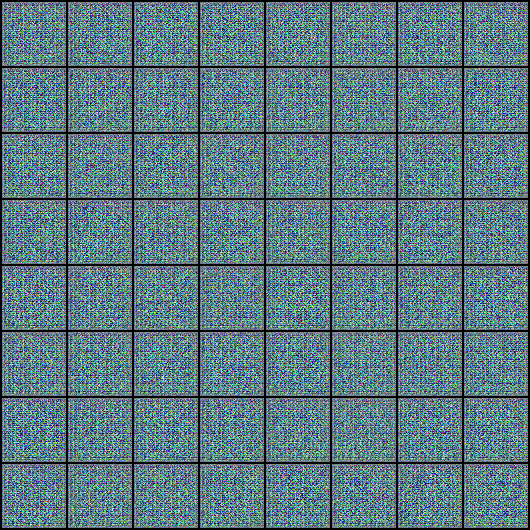

In [ ]:
Image('./generated/generated-images-0000.png')

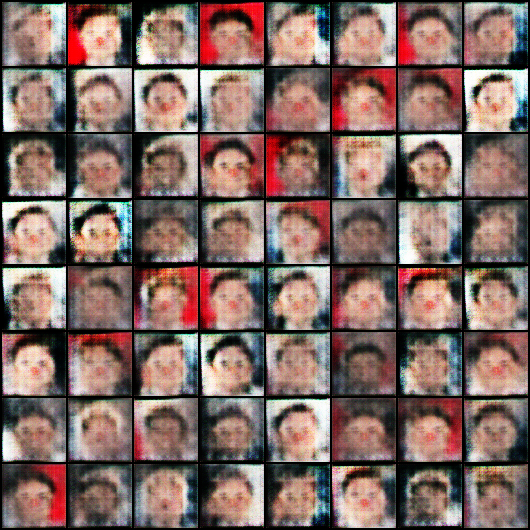

In [ ]:
Image('./generated/generated-images-0100.png')

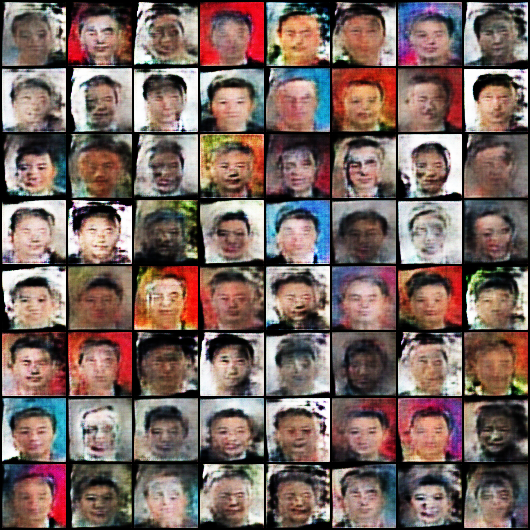

In [ ]:
Image('./generated/generated-images-0200.png')

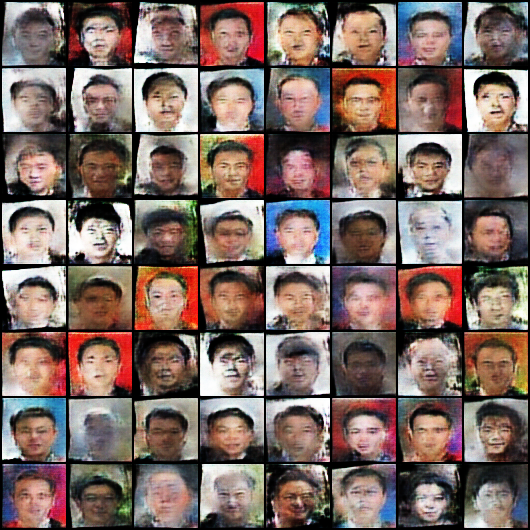

In [ ]:
Image('./generated/generated-images-0300.png')

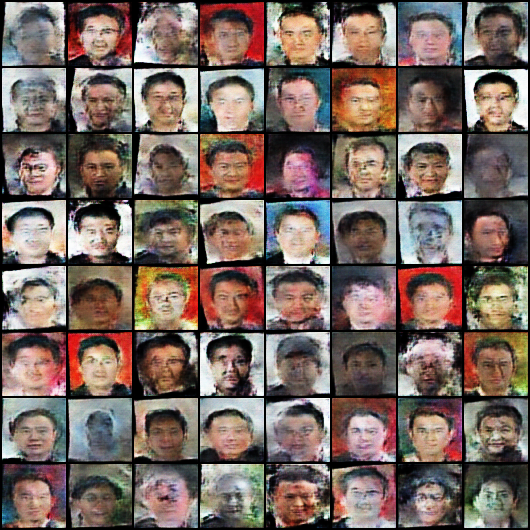

In [ ]:
Image('./generated/generated-images-0400.png')

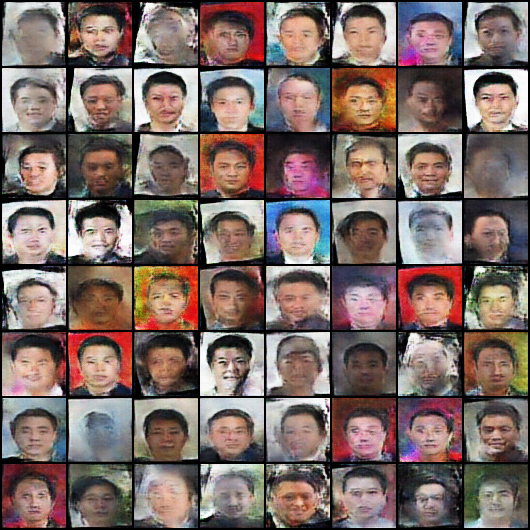

In [ ]:
Image('./generated/generated-images-0500.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()